In [1]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from timeprop import propagate
from adiabatic import _make_hamiltonian
import common
import landau_zener as lz
from IPython.display import HTML, display
import numpy as np
common.configure_plotting()

### Static plots: coefficients and energy levels

In [27]:
# v is the velocity
_, _, probs1 = lz.landau_zener_data(v=1, L=3, npts=200)
_, _, probs2 = lz.landau_zener_data(v=0.001, L=3, npts=200)

Text(0.5, 1.0, 'adiabatic')

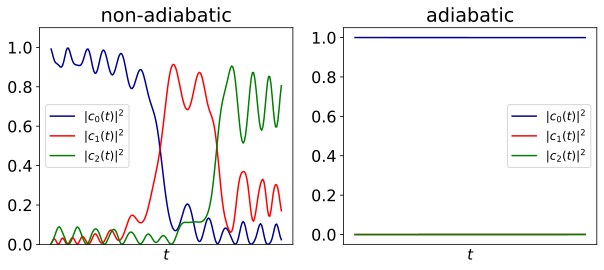

In [32]:
labels=[r'$|c_0(t)|^2$', r'$|c_1(t)|^2$', r'$|c_2(t)|^2$']
colors=['darkblue', 'red', 'green']

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

i = 0 
for level in probs1.T:
    ax[0].plot(level**2, label=labels[i], c=colors[i])
    i += 1
ax[0].set_ylim(0, 1.1)
i = 0
for level in probs2.T:
    ax[1].plot(level**2, label=labels[i], c=colors[i])
    i += 1

for axes in ax:
    #axes.set_ylabel(r'$|c|_$', fontsize=15)
    axes.set_xlabel(r'$t$', fontsize=15)
    axes.legend(fontsize=12)
    axes.set_xticks([]);

ax[0].set_title(r'non-adiabatic')
ax[1].set_title(r'adiabatic')


### Animation

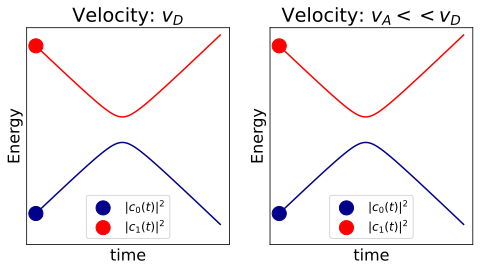

In [20]:
# L is the number of levels
# so far works for L =2 or 3
# try v=10, 1, 0.1, 0.01
times, ens, probs1 = lz.landau_zener_data(L=2, v=1)
_, _, probs2 = lz.landau_zener_data(L=2, v=0.001)
probs = [probs1, probs2]
anim = lz.animate_landau_zener_2plots(times=times, ens=ens, probs=probs, L=2)

In [ ]:
anim.save("pendulum.gif", writer='pillow')

In [21]:
display(HTML(common.to_svg_jshtml(anim)))

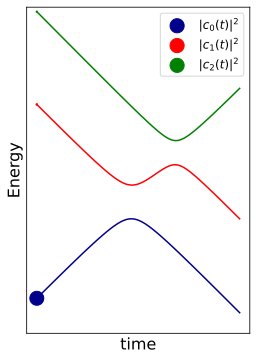

In [22]:
times, ens, probs = lz.landau_zener_data(L=3, v=1)
anim = lz.animate_landau_zener(times=times, ens=ens, probs=probs, L=3)

In [6]:
display(HTML(common.to_svg_jshtml(anim)))